# Analyse Baseline Autoencoder Model: Failure Cases

In [1]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision.transforms import Compose
from tqdm import tqdm
import mlflow.pytorch
import imgaug.augmenters as iaa
from pprint import pprint
import pandas as pd
import cv2

import mlflow

import matplotlib.pyplot as plt
%matplotlib inline

nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)

from src.data import TrainValTestSplitter, MURASubset
from src.data.transforms import GrayScale, Padding, Resize, HistEqualisation, MinMaxNormalization, ToTensor
from src.features.augmentation import Augmentation
from src.models import BottleneckAutoencoder
from src.models.torchsummary import summary
from src import XR_HAND_CROPPED_PATH, MODELS_DIR, MLFLOW_TRACKING_URI, XR_HAND_PATH

/usr/lib/python3/dist-packages/requests/__init__.py:80: RequestsDependencyWarning: urllib3 (1.24.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


## Setup

Set up general parameters and get model from MLFlow

In [2]:
size_sample = 20 # set how many image to be analysed

In [3]:
client = mlflow.tracking.MlflowClient(MLFLOW_TRACKING_URI)
client.list_experiments()

[<Experiment: artifact_location='/home/ubuntu/mlruns/2', experiment_id='2', lifecycle_stage='active', name='BottleneckAutoencoder'>,
 <Experiment: artifact_location='/home/ubuntu/mlruns/1', experiment_id='1', lifecycle_stage='active', name='BaselineAutoencoder'>,
 <Experiment: artifact_location='./mlruns/4', experiment_id='4', lifecycle_stage='active', name='DCGAN'>,
 <Experiment: artifact_location='./mlruns/3', experiment_id='3', lifecycle_stage='active', name='VAE'>]

In [4]:
run_id = '0ca304cc755f4203a5c6576edb14e4b9'
experiment = client.get_experiment('1')
path = f'{experiment.artifact_location}/{run_id}/artifacts/baseline_autoencoder/data/model.pth'
path

'/home/ubuntu/mlruns/1/0ca304cc755f4203a5c6576edb14e4b9/artifacts/baseline_autoencoder/data/model.pth'

Set up parameters and initiate model and dataset.

In [5]:
splitter = TrainValTestSplitter() 

run_params = {
    'batch_size': 64,
    'image_resolution': (512, 512),
    'num_epochs': 500,
    'batch_normalisation': True,
    'pipeline': {
        'hist_equalisation': True,
        'cropped': False,
    }
}

composed_transforms = Compose([GrayScale(),
                               Padding(),
                               Resize(run_params['image_resolution']),
                               HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
                               MinMaxNormalization(),
                               ToTensor()])

validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
                        patients=splitter.data_val.patient, transform=composed_transforms)

data_path = XR_HAND_CROPPED_PATH if run_params['pipeline']['cropped'] else XR_HAND_PATH

num_workers = 6

device = "cpu"
model = torch.load(path)

outer_loss = nn.MSELoss(reduction='none')
model.eval().to(device)

=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'src.models.BaselineAutoencoder' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


BaselineAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU()
    (10): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (15): ReLU()
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU()
    (18): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (19): ReLU()
  )
  (decoder): Sequentia

In [6]:
composed_transforms = Compose([GrayScale(),
                               Padding(max_shape=(750, 750)),  # max_shape - max size of image after augmentation
                               Resize(run_params['image_resolution']),
                               HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
                               MinMaxNormalization(),
                               ToTensor()])

# Dataset loaders
print(f'\nDATA SPLIT:')
splitter = TrainValTestSplitter(path_to_data=data_path)
validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
                        patients=splitter.data_val.patient, transform=composed_transforms)

val_loader = DataLoader(validation, batch_size=run_params['batch_size'], shuffle=True, num_workers=num_workers)


DATA SPLIT:
=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


## Run evaluation

In [7]:
val_metrics = model.evaluate(val_loader, 'validation', 
                             outer_loss, device, log_to_mlflow=False, qualitative_eval=True)

validation: 100%|██████████| 22/22 [04:32<00:00,  9.24s/it]

ROC-AUC on validation: 0.4795426829268293
MSE on validation: 0.0009537113946862519
F1-score on validation: 0.6815968841285297. Optimal threshold on validation: 0.00019940872152801603


In [8]:
print(val_metrics)

{'loss': array([0.00039051, 0.00094214, 0.00080839, ..., 0.00046773, 0.00099118,
       0.00116637], dtype=float32), 'true_label': array([1, 1, 1, ..., 1, 0, 0], dtype=int32), 'file_path': ['/home/viet/xray/data/train/XR_HAND/patient08483/study1_positive/image1.png', '/home/viet/xray/data/train/XR_HAND/patient09902/study1_positive/image3.png', '/home/viet/xray/data/train/XR_HAND/patient09813/study1_positive/image3.png', '/home/viet/xray/data/train/XR_HAND/patient10212/study1_negative/image1.png', '/home/viet/xray/data/train/XR_HAND/patient10411/study2_negative/image3.png', '/home/viet/xray/data/train/XR_HAND/patient09798/study1_positive/image2.png', '/home/viet/xray/data/train/XR_HAND/patient10314/study1_negative/image2.png', '/home/viet/xray/data/train/XR_HAND/patient11110/study1_negative/image2.png', '/home/viet/xray/data/train/XR_HAND/patient02570/study1_positive/image1.png', '/home/viet/xray/data/train/XR_HAND/patient10567/study1_negative/image4.png', '/home/viet/xray/data/train/XR

### Set up data frame for evaluation

In [9]:
data = pd.DataFrame.from_dict(val_metrics)
data = data.drop(columns="optimal mse threshold")

In [10]:
print(data)

          loss  true_label                                          file_path  \
0     0.000391           1  /home/viet/xray/data/train/XR_HAND/patient0848...   
1     0.000942           1  /home/viet/xray/data/train/XR_HAND/patient0990...   
2     0.000808           1  /home/viet/xray/data/train/XR_HAND/patient0981...   
3     0.000889           0  /home/viet/xray/data/train/XR_HAND/patient1021...   
4     0.000674           0  /home/viet/xray/data/train/XR_HAND/patient1041...   
5     0.004659           1  /home/viet/xray/data/train/XR_HAND/patient0979...   
6     0.000981           0  /home/viet/xray/data/train/XR_HAND/patient1031...   
7     0.000534           0  /home/viet/xray/data/train/XR_HAND/patient1111...   
8     0.001072           1  /home/viet/xray/data/train/XR_HAND/patient0257...   
9     0.000554           0  /home/viet/xray/data/train/XR_HAND/patient1056...   
10    0.001611           0  /home/viet/xray/data/train/XR_HAND/patient1035...   
11    0.000779           1  

### Analyse False Negative

In [11]:
false_negative = data[data['true_label'] == 1].nsmallest(size_sample, 'loss')
false_negative.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path,patient
404,0.000199409,1,/home/viet/xray/data/train/XR_HAND/patient09738/study1_positive/image2.png,9738
1202,0.00023525,1,/home/viet/xray/data/train/XR_HAND/patient09854/study1_positive/image3.png,9854
1055,0.000237529,1,/home/viet/xray/data/train/XR_HAND/patient07140/study1_positive/image2.png,7140
125,0.000267682,1,/home/viet/xray/data/train/XR_HAND/patient08792/study1_positive/image2.png,8792
384,0.000274232,1,/home/viet/xray/data/train/XR_HAND/patient09854/study1_positive/image1.png,9854
909,0.000278802,1,/home/viet/xray/data/train/XR_HAND/patient10017/study1_positive/image2.png,10017
689,0.000293546,1,/home/viet/xray/data/train/XR_HAND/patient09978/study1_positive/image2.png,9978
991,0.000304391,1,/home/viet/xray/data/train/XR_HAND/patient09878/study1_positive/image3.png,9878
1263,0.000308352,1,/home/viet/xray/data/train/XR_HAND/patient02570/study1_positive/image2.png,2570
280,0.000314951,1,/home/viet/xray/data/train/XR_HAND/patient05219/study1_positive/image1.png,5219


In [12]:
files_false_negative_path = false_negative['file_path']
files_false_negative = MURASubset(filenames=files_false_negative_path, transform=composed_transforms)

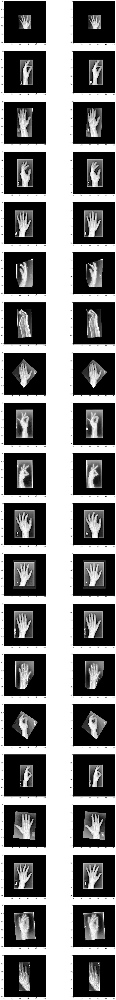

In [13]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasons for false negative:
  - relatively small images with a lot of black space
  - relatively little noise
  - common hands except for the arm without hand (why can the model reconstruct this so good?) and one with only parts of the hand

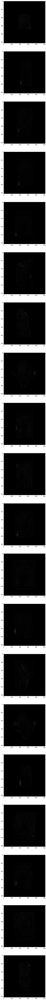

In [28]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)

### Analyse False positive

In [14]:
false_positive = data[data['true_label'] == 0].nlargest(size_sample, 'loss')
false_positive.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path,patient
39,0.00767959,0,/home/viet/xray/data/train/XR_HAND/patient10709/study2_negative/image1.png,10709
676,0.00709368,0,/home/viet/xray/data/train/XR_HAND/patient04442/study1_negative/image2.png,4442
1090,0.00707597,0,/home/viet/xray/data/train/XR_HAND/patient04442/study1_negative/image1.png,4442
101,0.00597094,0,/home/viet/xray/data/train/XR_HAND/patient11091/study1_negative/image3.png,11091
800,0.00480386,0,/home/viet/xray/data/train/XR_HAND/patient10845/study1_negative/image2.png,10845
485,0.00444794,0,/home/viet/xray/data/train/XR_HAND/patient04442/study1_negative/image3.png,4442
1310,0.00440736,0,/home/viet/xray/data/train/XR_HAND/patient10845/study1_negative/image1.png,10845
1308,0.00431129,0,/home/viet/xray/data/train/XR_HAND/patient11029/study1_negative/image3.png,11029
771,0.00420773,0,/home/viet/xray/data/train/XR_HAND/patient10279/study1_negative/image2.png,10279
623,0.00416955,0,/home/viet/xray/data/train/XR_HAND/patient11115/study1_negative/image3.png,11115


In [15]:
files_false_positive_path = false_positive['file_path']
files_false_positive = MURASubset(filenames=files_false_positive_path, transform=composed_transforms)

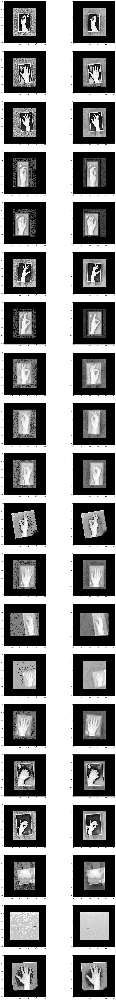

In [16]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasons for false positive:
  - a lot of noise around the hand &rarr; masking might help

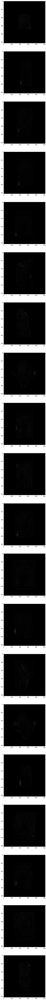

In [30]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)

### Analyse True Negative

In [17]:
true_negative = data[data['true_label'] == 0].nsmallest(size_sample, 'loss')
true_negative.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path,patient
107,0.000126251,0,/home/viet/xray/data/train/XR_HAND/patient05789/study1_negative/image1.png,5789
15,0.000153737,0,/home/viet/xray/data/train/XR_HAND/patient05789/study1_negative/image3.png,5789
1087,0.000251768,0,/home/viet/xray/data/train/XR_HAND/patient10217/study1_negative/image3.png,10217
433,0.000257135,0,/home/viet/xray/data/train/XR_HAND/patient01113/study1_negative/image3.png,1113
864,0.000268972,0,/home/viet/xray/data/train/XR_HAND/patient10322/study1_negative/image2.png,10322
13,0.000276748,0,/home/viet/xray/data/train/XR_HAND/patient01619/study1_negative/image1.png,1619
1158,0.000293543,0,/home/viet/xray/data/train/XR_HAND/patient10217/study1_negative/image1.png,10217
1009,0.000310701,0,/home/viet/xray/data/train/XR_HAND/patient06670/study1_negative/image2.png,6670
951,0.000311367,0,/home/viet/xray/data/train/XR_HAND/patient10529/study1_negative/image3.png,10529
250,0.000312084,0,/home/viet/xray/data/train/XR_HAND/patient10163/study1_negative/image2.png,10163


In [18]:
files_true_negative_path = true_negative['file_path']
files_true_negative = MURASubset(filenames=files_true_negative_path, transform=composed_transforms)

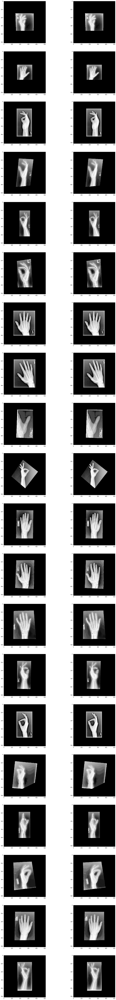

In [19]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

### Analyse True Positive

In [20]:
true_positive = data[data['true_label'] == 1].nlargest(size_sample, 'loss')
true_positive.style.set_properties(subset=['file_path'], **{'width': '300px'})

,loss,true_label,file_path,patient
455,0.0130116,1,/home/viet/xray/data/train/XR_HAND/patient09784/study1_positive/image4.png,9784
1006,0.00884985,1,/home/viet/xray/data/train/XR_HAND/patient09798/study1_positive/image1.png,9798
586,0.00780895,1,/home/viet/xray/data/train/XR_HAND/patient09809/study1_positive/image2.png,9809
5,0.00465911,1,/home/viet/xray/data/train/XR_HAND/patient09798/study1_positive/image2.png,9798
984,0.00375432,1,/home/viet/xray/data/train/XR_HAND/patient09424/study2_positive/image2.png,9424
1020,0.00316964,1,/home/viet/xray/data/train/XR_HAND/patient09768/study1_positive/image2.png,9768
801,0.00295635,1,/home/viet/xray/data/train/XR_HAND/patient09889/study1_positive/image2.png,9889
168,0.00292931,1,/home/viet/xray/data/train/XR_HAND/patient09879/study1_positive/image1.png,9879
828,0.00290435,1,/home/viet/xray/data/train/XR_HAND/patient10095/study1_positive/image2.png,10095
1093,0.0028659,1,/home/viet/xray/data/train/XR_HAND/patient10025/study1_positive/image1.png,10025


In [21]:
files_true_positive_path = true_positive['file_path']
files_true_positive = MURASubset(filenames=files_true_positive_path, transform=composed_transforms)

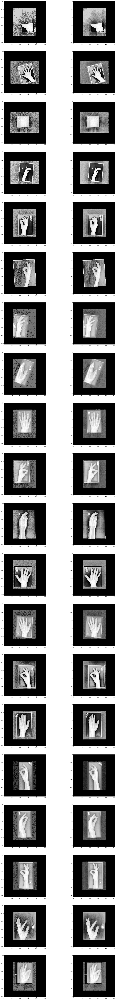

In [22]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

Reasions for true positive:
  - a lot of noise &rarr; model can't reconstruct noise &rarr; classified as positve see following plot

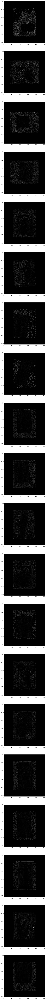

In [27]:
fig, ax = plt.subplots(nrows=size_sample, ncols=1, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    image_substract = output.detach().numpy()[0, 0, :, :] - image_inp.numpy()[0, 0, :, :]
    ax[i].imshow(image_substract, cmap='gray', vmin=0, vmax=1)